In [2]:
import sys
import pickle
import numpy as np
import pandas as pd
import plotly
from torch.utils.data import TensorDataset
plotly.offline.init_notebook_mode()
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import sklearn.metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.decomposition import TruncatedSVD,PCA
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
PROCESSED_DATA_DIR = fr'C:\Users\achfr\timeseries-clustering-vae\cluster_train\to_import\\'

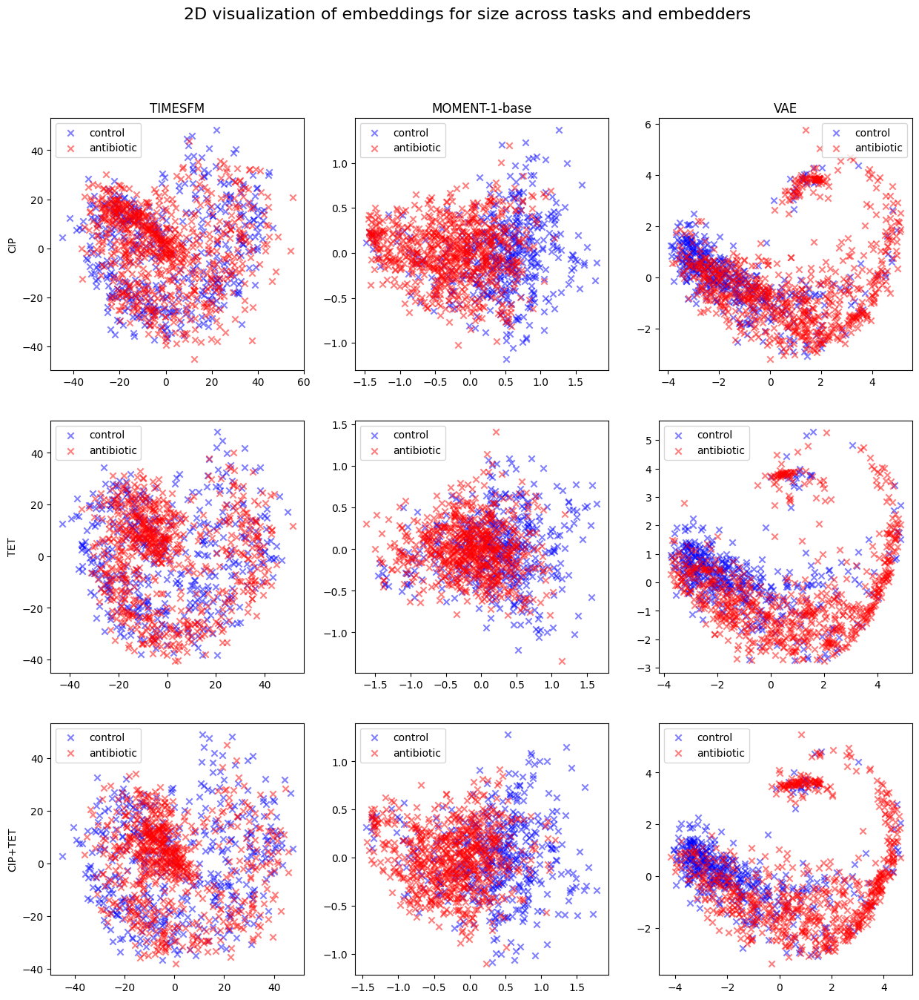

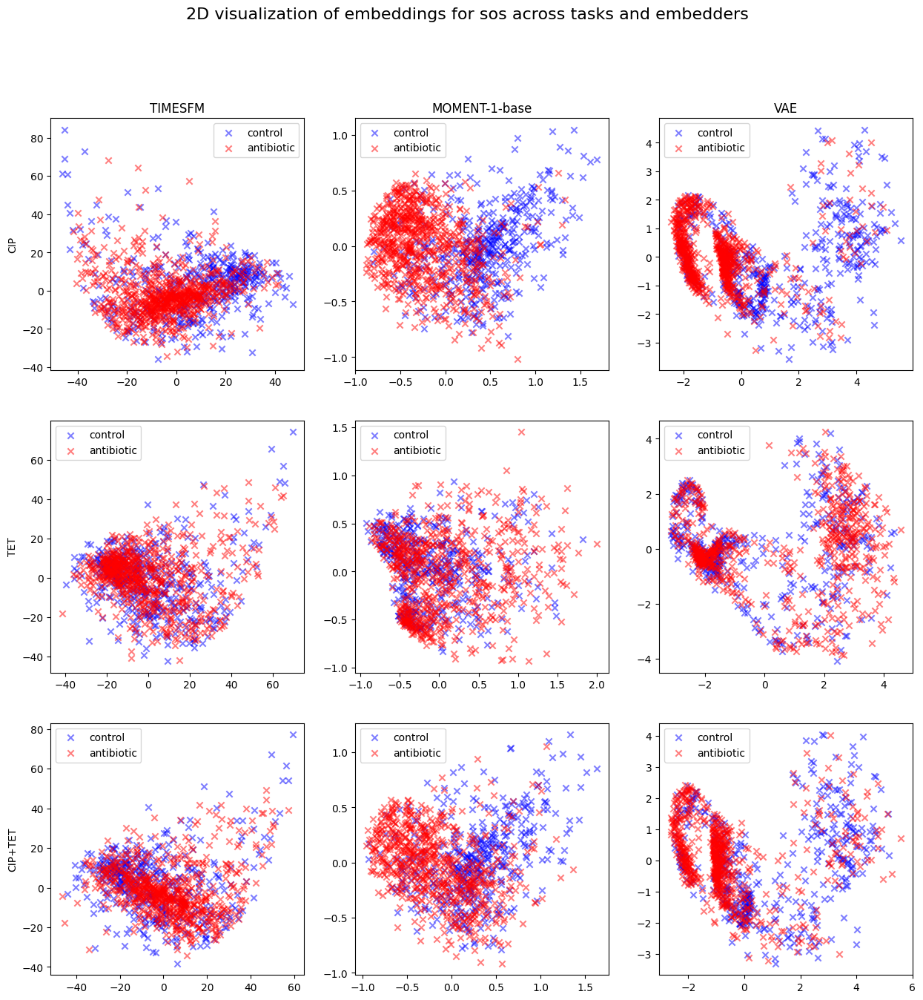

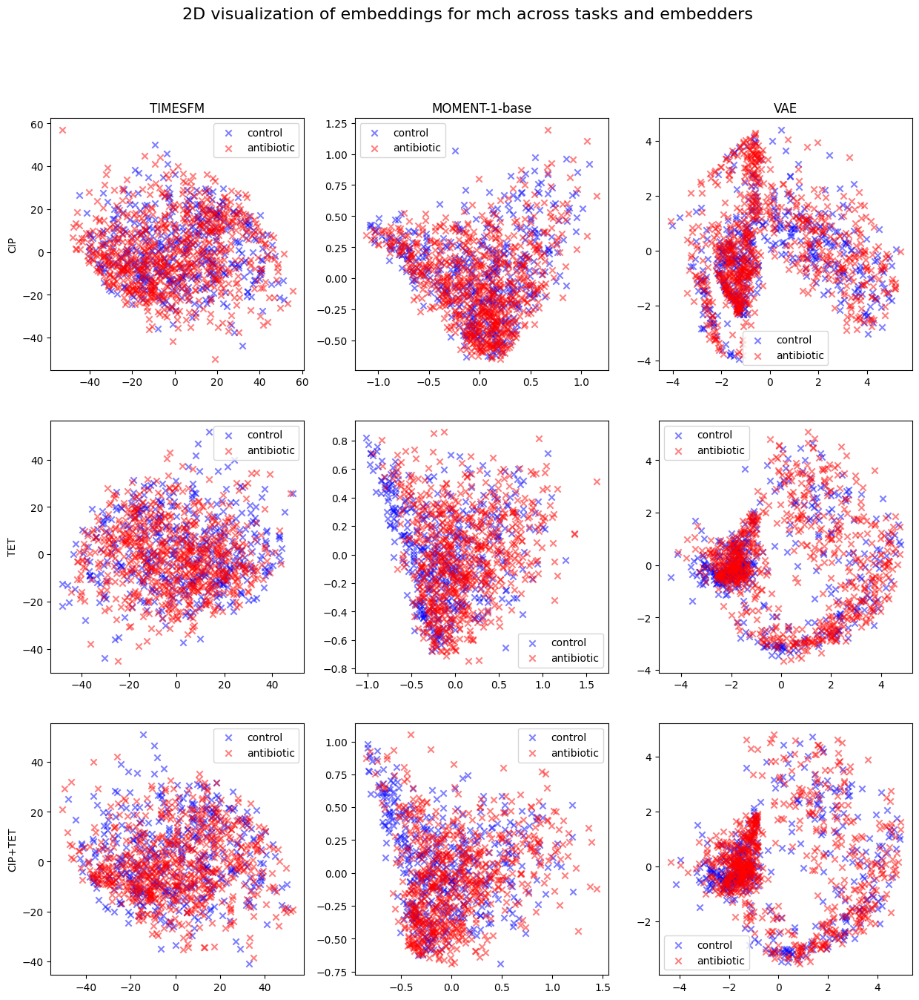

In [13]:
for variable in ['size','sos', 'mch']:
    fig,ax = plt.subplots(3,3, figsize=(15,15))

    for i,task in enumerate(["cip", "tet", "ciptet"]):
        for j,embedder_name in enumerate(["timesfm", "MOMENT-1-base", "vae"]):
            with open(PROCESSED_DATA_DIR+f'embeddings_{variable}_{task}_{embedder_name}.pkl', 'rb') as f:
                embeddings = np.array(pickle.load(f))
            with open(PROCESSED_DATA_DIR + f"y_{variable}_{task}.pkl", 'rb') as f:
                y_full = np.array(pickle.load(f))
            pca = PCA(n_components=2)
            embeddings_2d = pca.fit_transform(embeddings)
            # embeddings_2d = TSNE(n_components=2, random_state=42).fit_transform(embeddings)
            ax[i,j].scatter(embeddings_2d[y_full==0,0], embeddings_2d[y_full==0,1], c='blue', label='control', alpha=0.5, marker='x')
            ax[i,j].scatter(embeddings_2d[y_full==1,0], embeddings_2d[y_full==1,1], c='red', label='antibiotic', alpha=0.5, marker='x')
            # ax[i,j].set_title(f"{embedder_name} embeddings for {variable} on {task}")
            ax[i,j].legend()
    ax[0,0].set_title(f"TIMESFM")
    ax[0,1].set_title(f"MOMENT-1-base")
    ax[0,2].set_title(f"VAE")
    ax[0,0].set_ylabel(f"CIP")
    ax[1,0].set_ylabel(f"TET")
    ax[2,0].set_ylabel(f"CIP+TET")
    fig.suptitle(f"2D visualization of embeddings for {variable} across tasks and embedders", fontsize=16)

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\achfr\\timeseries-clustering-vae\\cluster_train\\to_import\\\\embeddings_size_control_timesfm.pkl'

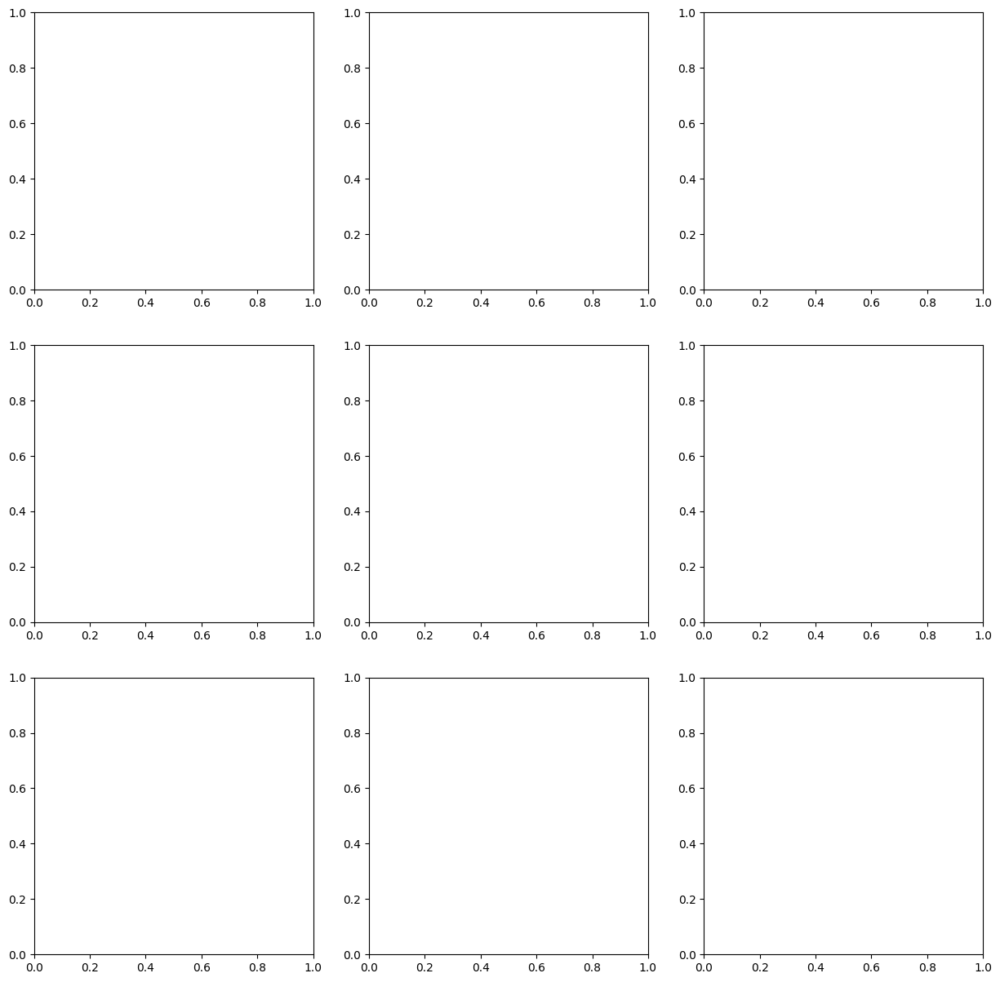

In [ ]:
for variable in ['size']:
    fig,ax = plt.subplots(3,3, figsize=(15,15))

    for i,task in enumerate(["control"]):
        for j,embedder_name in enumerate(["timesfm", "MOMENT-1-base", "vae","ts2vec"]):
            with open(PROCESSED_DATA_DIR+f'embeddings_{embedder_name}.pkl', 'rb') as f:
                embeddings = np.array(pickle.load(f))
            with open(PROCESSED_DATA_DIR + f"y_{variable}_{task}.pkl", 'rb') as f:
                y_full = np.array(pickle.load(f))
            pca = PCA(n_components=2)
            embeddings_2d = pca.fit_transform(embeddings)
            # embeddings_2d = TSNE(n_components=2, random_state=42).fit_transform(embeddings)
            ax[i,j].scatter(embeddings_2d[y_full==0,0], embeddings_2d[y_full==0,1], c='blue', label='control', alpha=0.5, marker='x')
            ax[i,j].scatter(embeddings_2d[y_full==1,0], embeddings_2d[y_full==1,1], c='red', label='antibiotic', alpha=0.5, marker='x')
            # ax[i,j].set_title(f"{embedder_name} embeddings for {variable} on {task}")
            ax[i,j].legend()
    ax[0,0].set_title(f"TIMESFM")
    ax[0,1].set_title(f"MOMENT-1-base")
    ax[0,2].set_title(f"VAE")
    ax[0,0].set_ylabel(f"CIP")
    ax[1,0].set_ylabel(f"TET")
    ax[2,0].set_ylabel(f"CIP+TET")
    fig.suptitle(f"2D visualization of embeddings for {variable} across tasks and embedders", fontsize=16)

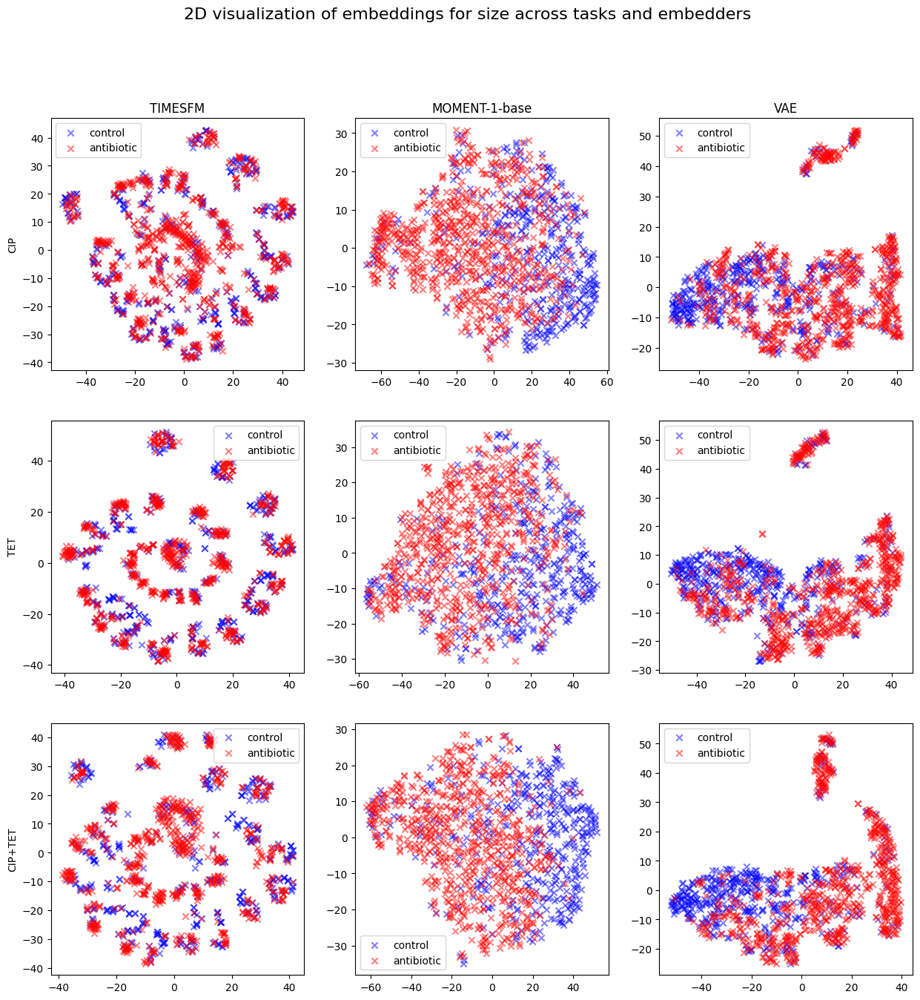

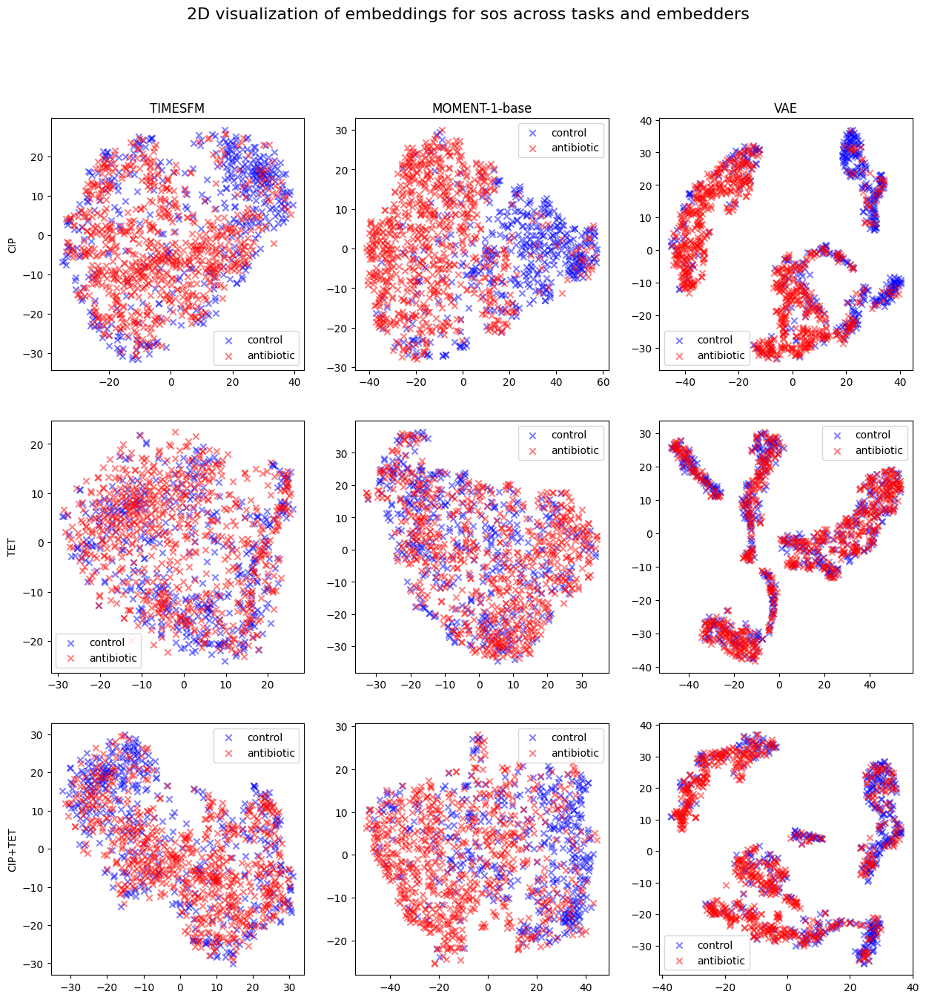

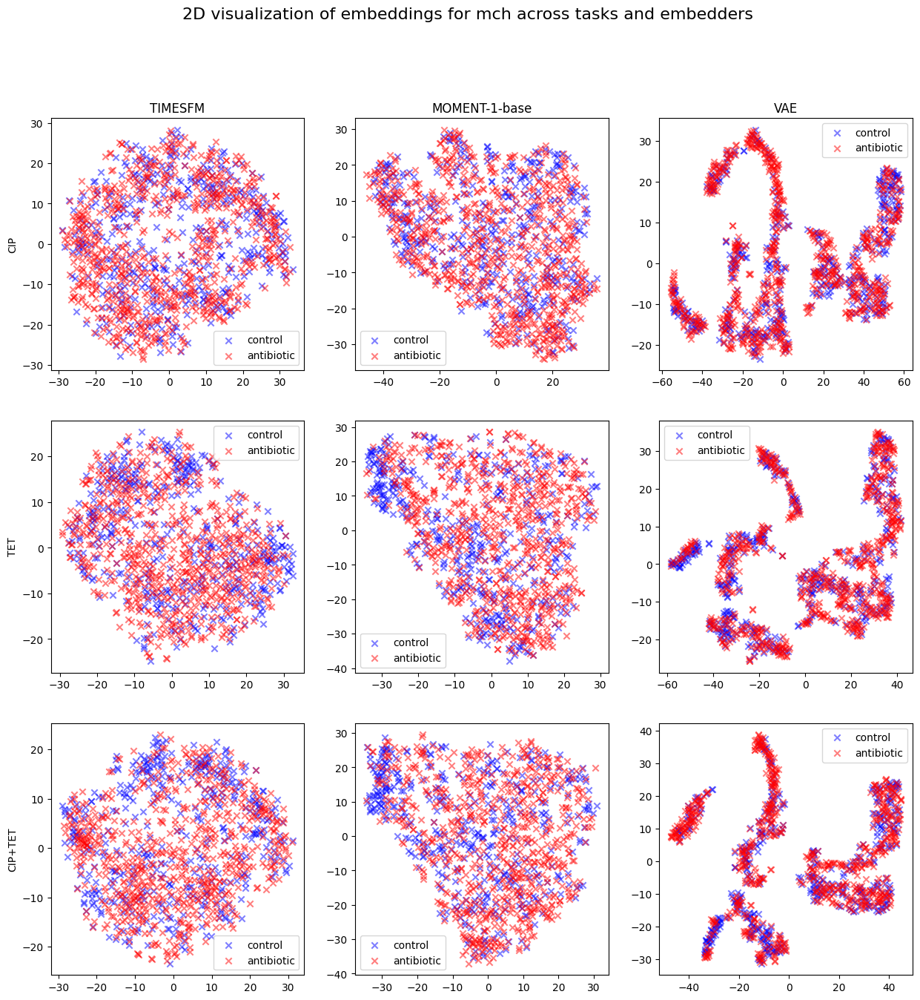

In [14]:
for variable in ['size','sos', 'mch']:
    fig,ax = plt.subplots(3,3, figsize=(15,15))

    for i,task in enumerate(["cip", "tet", "ciptet"]):
        for j,embedder_name in enumerate(["timesfm", "MOMENT-1-base", "vae"]):
            with open(PROCESSED_DATA_DIR+f'embeddings_{variable}_{task}_{embedder_name}.pkl', 'rb') as f:
                embeddings = np.array(pickle.load(f))
            with open(PROCESSED_DATA_DIR + f"y_{variable}_{task}.pkl", 'rb') as f:
                y_full = np.array(pickle.load(f))
            # pca = PCA(n_components=2)
            # embeddings_2d = pca.fit_transform(embeddings)
            embeddings_2d = TSNE(n_components=2, random_state=42).fit_transform(embeddings)
            ax[i,j].scatter(embeddings_2d[y_full==0,0], embeddings_2d[y_full==0,1], c='blue', label='control', alpha=0.5, marker='x')
            ax[i,j].scatter(embeddings_2d[y_full==1,0], embeddings_2d[y_full==1,1], c='red', label='antibiotic', alpha=0.5, marker='x')
            # ax[i,j].set_title(f"{embedder_name} embeddings for {variable} on {task}")
            ax[i,j].legend()
    ax[0,0].set_title(f"TIMESFM")
    ax[0,1].set_title(f"MOMENT-1-base")
    ax[0,2].set_title(f"VAE")
    ax[0,0].set_ylabel(f"CIP")
    ax[1,0].set_ylabel(f"TET")
    ax[2,0].set_ylabel(f"CIP+TET")
    fig.suptitle(f"2D visualization of embeddings for {variable} across tasks and embedders", fontsize=16)